## Installing Necessary packages

In [1]:
import os
import torch
import numpy as np
from tqdm import tqdm
import torch.nn as nn
from PIL import Image
import matplotlib.pyplot as plt
from torchvision import transforms
from torch.utils.data import DataLoader, Dataset, Subset

## Aim of this Notebook
1. To train a Simple CNN Model to classify whether given image corresponds to a person's face or not (Binary Classification, i.e output dimension of CNN is 1)
2. To train a Self Supervised Variational Autoencoders (SS-VAE):
    - Using the above CNN as the encoder that outputs class label ($z_0$), `z` dimensional mean vector and `z` dimensional standard deviation (i.e output dimension of the encoder is $2 \times z + 1$). The class Label is used for classification of whether the input image is a human face or not. The other two `z` vectors are reparametrised to sample the latent vector.
    - Decoder is built with typical transpose convolution that upscales the latent vector into reconstructed image. The idea here is that only when the class label is 1 (i.e image is face) the correspondind loss for VAE is calculated.
   
3. **To use the SS-VAE to uncover hidden biases and uncertainty (More on this below)**

## Architecture

![Architecture](assets/Architecture.png)

Reiterating;

Input data (mixure of face and non-face images) are fed into the encoder that outputs class label $z_0$vand two  `z` dimensional vectors. By reparametrising the other two `z` dimensional vectors from encoder, latent vector is sampled. Only for those images that have human faces ($z_0=1$) the reconstruction loss is calculated and then the loss is backpropagated.

## The idea
VAEs are good at learning the underlying data distribution of the input. VAEs in general are unsupervised learning models, which learns to capture the overall data distribution without any consideration for specific labels or class information. This makes them good at capturing instrinsic structure of data, but less suited for tasks like classification

When we use labels in the above way where our model is using external labels only for classification and not for reconstruction we also force the model to learn the distribution in a way so that it learns discriminative features as well.

During training, the VAE will learn to map the input data to a latent space where similar data points (from the same class) are closer together and dissimilar data points (from different classes) are farther apart. By leveraging both labeled and unlabeled data, the model can capture the underlying structure of the data more effectively. Hence we attempt using SS-VAE and not plain VAE.

## Preparing data
I prepared a direct usable dataset for this problem. You can download it from here: [kaggle](https://www.kaggle.com/datasets/muhammadwasee/ss-vae). It is a mixture of tiny-imagenet dataset and celebA face dataset. To make it simple, I also ensured to maintain the class balance.

- Train: 200000 images
    - 100000 Tiny Imagenet
    - 100000 CelebA
- Test: 20000 images
    - 10000 Tiny Imagenet
    - 10000 CelebA
        
- Tiny ImageNet Dataset for Non face images
- CelebA Dataset for face images

In [2]:
class Data(Dataset):
    def __init__(self, transform=None, path=''):
        super().__init__()
        self.path = path
        self.transform = transform
        self.files = os.listdir(self.path) 
        
    def __len__(self):
        return len(self.files)
    
    def __getitem__(self, idx):
        file = self.files[idx]
        if file[0].isdigit():
            label = 1
        else:
            label = 0
            
        image = Image.open(os.path.join(self.path, file))
        # Few images are gray scale, this `if` ensures to convert them to 3 channeled image
        if image.mode == 'L':
            image = image.convert('RGB')

        if self.transform:
            image = self.transform(image)
        
        return image, label
        

In [3]:
transform = transforms.Compose([
    transforms.Resize((128, 128)),  # Resize the image to a fixed size
    transforms.ToTensor(),           # Convert PIL Image to PyTorch Tensor
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalize the image
])


In [4]:
train_data = Data(transform=transform, path='/kaggle/input/ss-vae/temp/train')
test_data = Data(transform=transform, path='/kaggle/input/ss-vae/temp/test')

In [5]:
len(train_data)

200000

In [6]:
len(test_data)

20000

In [7]:
train_loader = DataLoader(train_data, batch_size=128, shuffle=True)
valid_loader = DataLoader(test_data, batch_size=128, shuffle=False)

## Simple Face Classification Model
Building a simple yet efficient CNN model for face classification which will become the encoder in SS-VAE. 

In [8]:
# import math
# def same_pad(n, f, s):
#     p = math.ceil(((n - 1)*s -n + f)/2)
#     return p

In [9]:
# same_pad(128, 5, 2)

In [10]:
filters = 12
CNN = nn.Sequential(
    nn.Conv2d(in_channels= 3, out_channels= filters, kernel_size=5, stride=2),#, padding=same_pad(128, 5, 2)),
    nn.ReLU(),
    nn.BatchNorm2d(filters),
    nn.Conv2d(in_channels= filters, out_channels= 2*filters, kernel_size=5, stride=2),#, padding=same_pad(128, 5, 2)),
    nn.ReLU(),
    nn.BatchNorm2d(2*filters),
    nn.Conv2d(in_channels= 2*filters, out_channels= 4*filters, kernel_size=3, stride=2),#, padding=same_pad(128, 3, 2)),
    nn.ReLU(),
    nn.BatchNorm2d(4*filters),
    nn.Conv2d(in_channels= 4*filters, out_channels= 6*filters, kernel_size=3, stride=2),#, padding=same_pad(128, 3, 2)),
    nn.ReLU(),
    nn.BatchNorm2d(6*filters),
    nn.Flatten(),
    nn.Linear(2592, 512),
    nn.ReLU(),
    nn.Linear(512, 1)
)

Below is the typical PyTorch train loop boiler plate. Binary Cross Entropy is used as the loss function and Adam as optimization.

In [11]:
def train(model, epoch, data, data_vl):
    train_loss = [0] * epoch
    train_accuracy = [0] * epoch
    validation_loss = [0] * epoch
    validation_accuracy = [0] * epoch
    for i in range(epoch):
        for j, (x_batch, y_batch) in enumerate(data):
            if (j % 100 == 0):
                print(f'iter: {j+1}')
            y_batch = y_batch.reshape(-1,1).to(torch.float32)
            x_batch = x_batch.to(device)
            y_batch = y_batch.to(device)
            
            pred = model(x_batch)

            loss = loss_fn(pred, y_batch)
            
            loss.backward()
            optimizer.step()
            optimizer.zero_grad()
            
            train_loss[i] += (loss.item() * x_batch.size(0))
            is_crt = ((pred>=0.5) == y_batch).sum()
            train_accuracy[i] += is_crt.float()
        train_loss[i] /= len(data.dataset)
        train_accuracy[i] /= len(data.dataset)
        
        with torch.no_grad():
            for x_batch, y_batch in data_vl:
                y_batch = y_batch.reshape(-1,1).to(torch.float32)#.to(device)
                x_batch = x_batch.to(device)
                y_batch = y_batch.to(device)
                pred = model(x_batch)
                loss = loss_fn(pred, y_batch)
                validation_loss[i] += (loss.item() * x_batch.size(0))
                is_crt = ((pred>=0.5) == y_batch).sum()
                validation_accuracy[i] += is_crt.float()
            validation_loss[i] /= len(data_vl.dataset)
            validation_accuracy[i] /= len(data_vl.dataset)
        print(f'Epoch {i+1} accuracy: {train_accuracy[i]:.4f} val_accuracy:{validation_accuracy[i]:.4f}')
    return train_loss, train_accuracy, validation_loss, validation_accuracy


1 epoch is more that enough, the reason being the enormous amount of training data and the sufficient complexity of the CNN model to capture the pattern. We get ~99% accuracy in `Validation set`!

In [12]:
device = torch.device('cuda')
CNN = CNN.to(device)
loss_fn = nn.BCEWithLogitsLoss()
optimizer = torch.optim.Adam(CNN.parameters(), lr=0.001)
train(CNN, 1, train_loader, valid_loader)

iter: 1
iter: 101
iter: 201
iter: 301
iter: 401
iter: 501
iter: 601
iter: 701
iter: 801
iter: 901
iter: 1001
iter: 1101
iter: 1201
iter: 1301
iter: 1401
iter: 1501
Epoch 1 accuracy: 0.9939 val_accuracy:0.9980


([0.018780915196249262],
 [tensor(0.9939, device='cuda:0')],
 [0.00768066793428734],
 [tensor(0.9980, device='cuda:0')])

Well and good, we got our first work done, i.e building the CNN for face classification. Next we will have to use the above CNN as encoder by changing its output dimension from $1$ to $2 \times z + 1$ where `z` is the latent vector dimension. Before that lets define few other utility functions (Dont get confused with $z_0$ and `z`)

## Other Utilities
1. Defining loss function used for SS-VAE.
    - Classification loss: Binary Cross entropy
    - $ \text{VAE Loss} = \text{Reconstruction Loss} + \text{KL Divergence Loss} $
        - $ \text{Reconstruction Loss} = \frac{1}{N} \sum_{i=1}^{N} \| x_i - \hat{x}_i \| $

        - $ \text{KL Divergence Loss} = \frac{1}{2} \sum_{j=1}^{J} (\sigma_j^2 + \mu_j^2  - 1 - \log(\sigma_j^2)) $
        - I am considering, for simplicity, mean absolute error for renconstruction, it can be mean squared error as well.
        
        
2. Defining function to sample latent vectors from `z_mean` and `z_logsigma` (it can be just `z_sigma` as well, but for simplicity of calculation I am calling and using it as `z_logsigma`)
    - Reparametrisation/sampling: $z = \mu + e^{0.5 log(\sigma)} * \epsilon $
    
    
3. I am also defining a `Reshape` PyTorch layer which is later used in the decoder.

In [13]:
def vae_loss_function(x, x_hat, mu, z_logsigma, kl_weight=0.0005):
    KL_loss = 0.5 * (torch.exp(z_logsigma) + mu**2 - 1 - z_logsigma).sum(axis=-1)
    
    reconstruction_loss = (abs(x - x_hat)).mean(axis=(1,2,3))
    
    vae_loss = kl_weight * KL_loss + reconstruction_loss
    
    return vae_loss
    
def ss_vae_loss_function(x, x_pred, y, y_pred, mu, log_sigma):
    vae_loss = vae_loss_function(x, x_pred, mu, log_sigma)

    classification_loss = loss_fn_vae(y_pred, y) 

    vae_loss = (y.reshape(-1) * (vae_loss)).mean()
    
    total_loss = classification_loss + vae_loss
    
    return total_loss, classification_loss, vae_loss

def sampling(z_mean, z_logsigma):  
    batch, latent_dim = z_mean.shape
    
    epsilon = torch.randn(batch, latent_dim).to(device)
    
    z = z_mean +  torch.exp(0.5 * z_logsigma) * epsilon
    return z

class Reshape(nn.Module):
    def __init__(self, shape):
        super(Reshape, self).__init__()
        self.shape = shape

    def forward(self, x):
        return x.view(x.shape[0], *self.shape[::-1])

## Semi-Supervised VAE
![Architecture](assets/Architecture.png)

Refer the above figure;
- Here my encoder is the same CNN built above, except that the difference lies in the output dimension of the CNN.
    - Latent vector dimension is taken arbitarily to be 32
- The decoder comprises of set of transpose convolutions where kernal, padding and strides are choosen in such a way to reconstruct the image with same dimension of that of input.

In [14]:
z_dim = 32
n_filters = 12

# Encoder
encoder = nn.Sequential(
    nn.Conv2d(in_channels= 3, out_channels= filters, kernel_size=5, stride=2),#, padding=same_pad(128, 5, 2)),
    nn.ReLU(),
    nn.BatchNorm2d(filters),
    nn.Conv2d(in_channels= filters, out_channels= 2*filters, kernel_size=5, stride=2),#, padding=same_pad(128, 5, 2)),
    nn.ReLU(),
    nn.BatchNorm2d(2*filters),
    nn.Conv2d(in_channels= 2*filters, out_channels= 4*filters, kernel_size=3, stride=2),#, padding=same_pad(128, 3, 2)),
    nn.ReLU(),
    nn.BatchNorm2d(4*filters),
    nn.Conv2d(in_channels= 4*filters, out_channels= 6*filters, kernel_size=3, stride=2),#, padding=same_pad(128, 3, 2)),
    nn.ReLU(),
    nn.BatchNorm2d(6*filters),
    nn.Flatten(),
    nn.Linear(2592, 512),
    nn.ReLU(),
    # 2 * z_dim for std and mean
    # 1 for classification token
    nn.Linear(512, 2*z_dim+1)
)

# Decoder
decoder = nn.Sequential(
    nn.Linear(z_dim, 6*6*6*n_filters),
    Reshape((6, 6, 6*n_filters)),
    
    nn.ConvTranspose2d(in_channels=6*n_filters, out_channels=4*n_filters, kernel_size=3, stride=3, padding=2),
    nn.ConvTranspose2d(in_channels=4*n_filters, out_channels=2*n_filters, kernel_size=3, stride=2, padding=0),
    nn.ConvTranspose2d(in_channels=2*n_filters, out_channels=1*n_filters, kernel_size=4, stride=3, padding=13),
    nn.ConvTranspose2d(in_channels=1*n_filters, out_channels=3, kernel_size=6,  stride=2),
)

# SS-VAE
class SS_VAE(nn.Module):
    def __init__(self, z_dim):
        super().__init__()
        self.latent_dim = z_dim
    
        self.encoder = encoder
        self.decoder = decoder
        
    def encode(self, x):
        encoder_output = self.encoder(x)
        
        y_logit = encoder_output[:, 0].reshape(encoder_output.shape[0], -1)
        z_mean = encoder_output[:, 1:self.latent_dim+1]
        z_logsigma = encoder_output[:, 1+self.latent_dim: ]
        
        return y_logit, z_mean, z_logsigma
    
    def decode(self, x):
        reconstruction = decoder(x)
        return reconstruction
    
    def forward(self, x):
        y_logit, z_mean, z_logsigma = self.encode(x)
        z = sampling(z_mean, z_logsigma)
        x_hat = self.decode(z)
        
        return y_logit, z_mean, z_logsigma, x_hat

        

Below is almost the same train loop used in the face classification above, except that the snippet is slightly modified to accept multiple outputs from encoder and loss values returned. 

**Note :** You dont need to manually backpropagate each loss (classification and VAE loss) seperately, rather it would suffice to backprogate the `total loss` returned from `ss_vae_loss_function` that is sum of both the losses.

In [15]:
def train_vae(model, epoch, data, data_vl):
    train_loss = [0] * epoch
    train_accuracy = [0] * epoch
    validation_loss = [0] * epoch
    validation_accuracy = [0] * epoch
    for i in range(epoch):
        model.train() 
        for j, (x_batch, y_batch) in enumerate(data):
            if j % 100 == 0:
                print(f'iter: {j}')
            y_batch = y_batch.reshape(-1,1).to(torch.float32)
            x_batch = x_batch.to(device)
            y_batch = y_batch.to(device)
            
            pred, mean, logsigma, x_hat = model(x_batch)
            
            loss, classloss, vaeloss = ss_vae_loss_function(x_batch, x_hat, y_batch, pred, mean, logsigma)

            loss.backward()
            
            optimizer_vae.step()
            optimizer_vae.zero_grad()

            train_loss[i] += (loss.item() * x_batch.size(0))
            
            pred = torch.sigmoid(pred)
            
            is_crt = ((pred>=0.5) == y_batch).sum()
            train_accuracy[i] += is_crt.float()

        train_loss[i] /= len(data.dataset)
        train_accuracy[i] /= len(data.dataset)
        
        model.eval() 
        with torch.no_grad():
            for x_batch, y_batch in data_vl:
                y_batch = y_batch.reshape(-1,1).to(torch.float32)#.to(device)
                x_batch = x_batch.to(device)
                y_batch = y_batch.to(device)
                
                pred, mean, logsigma, x_hat = model(x_batch)
                loss, classloss, vaeloss = ss_vae_loss_function(x_batch, x_hat, y_batch, pred, mean, logsigma)
                
                validation_loss[i] += (loss.item() * x_batch.size(0))
                
                pred = torch.sigmoid(pred)
                is_crt = ((pred>=0.5) == y_batch).sum()
                validation_accuracy[i] += is_crt.float()
            validation_loss[i] /= len(data_vl.dataset)
            validation_accuracy[i] /= len(data_vl.dataset)
        print(f'Epoch {i+1} accuracy: {train_accuracy[i]:.4f} val_accuracy:{validation_accuracy[i]:.4f}')
    return train_loss, train_accuracy, validation_loss, validation_accuracy


Again, 1 epoch is more that sufficient and fun fact: Validation Accuracy is more than that of train Accuracy : ), probably attributing to more complex data samples in train set.

In [25]:
np.random.seed(42)
torch.manual_seed(42)
ss_vae = SS_VAE(32).to(device)
loss_fn_vae = nn.BCEWithLogitsLoss()
optimizer_vae = torch.optim.Adam(ss_vae.parameters(), lr=0.0006)
train_vae(ss_vae, 1, train_loader, valid_loader)

iter: 0
iter: 100
iter: 200
iter: 300
iter: 400
iter: 500
iter: 600
iter: 700
iter: 800
iter: 900
iter: 1000
iter: 1100
iter: 1200
iter: 1300
iter: 1400
iter: 1500
Epoch 1 accuracy: 0.9976 val_accuracy:0.9980


([0.2516106893539429],
 [tensor(0.9976, device='cuda:0')],
 [0.24822428677082062],
 [tensor(0.9980, device='cuda:0')])

We are done with our second task/aim of this notebook, i.e building a Semi-Supervised VAE. We can verify from the classification accuracy that the model learnt as expected.

Next, lets get into the exciting part of this Notebook.

## Uncovering Bias

Any model is susceptible to Bias, i.e giving more preference to specific set of features and neglecting others. In case of face classification model, we might not directly know where the bias lies. The model can give preference to male/female, white/black, wearing glass/not wearing, hair colors etc.

Bias becomes a serious concern when certain sections of the society are implicity under represented by the model, which brings serious societal concerns. One way to uncover bias is to manually annonate each face data with several features like black/white, male/female, hair color etc. After training we can find performance on each categories. But this approach has few issues;
1. Tiring annotations - It take a lot of time and effort for manual annotations
2. Features - We might not know `all` the features that a model will learn, so even if we are to annotate it wouldn't be efficient

Hence we have to devise a mechanism that can assist us in uncovering bias automatically within the model. VAEs are good at learning the underlying probability distribution of input. Why not use that information and analyse the feature space learnt by the model to uncover potential bias?

The following is a primitive, yet interesting, approach to uncover biases and uncertainity in the learned model.

Lets first create a dataset of faces alone. We will be using this data in the subsequent code cells.


In [26]:
import glob
class Faces(Dataset):
    def __init__(self, transform, path):
        self.path = path
        self.files = glob.glob(f'{path}/[0-9]*')
        self.transform = transform
    def __len__(self):
        return len(self.files)
    def __getitem__(self, idx):
        file = self.files[idx]
        image = Image.open(os.path.join(self.path, file))
        if image.mode == 'L':
            image = image.convert('RGB')
            
        if self.transform:
            image = self.transform(image)
        
        return image, 1.0, file

In [27]:
face_data = Faces(transform=transform, path='/kaggle/input/ss-vae/temp/test')
face_loader = DataLoader(face_data, batch_size=1)
len(face_loader)

10000

## 1) Analysis  based on reconstruction  loss

The higher the reconstruction loss, we can say, the harder that particular example is for the model to learn.
These examples are those that have high model uncertainty. However, this is not necessarily the same as bias. 

**Why**? Because, if we are to make the model more sophisticated it can then learn these hard examples, but bias is something that will exist irrespective of the sophistication of the model, except if it is made to avoid bias explicitly.

In [28]:
VAE_loss = []
z_mean = []
files = []
y_logit = []
for i, (x, y, file) in enumerate(face_loader):
    x = x.to(device)
    y = y.to(device)
    pred, mean, logsigma, x_hat = ss_vae(x)
    loss, classloss, vaeloss = ss_vae_loss_function(x, x_hat, y.reshape(-1,1), pred, mean, logsigma)
    VAE_loss.append(loss.detach().cpu().numpy())
    z_mean.append(mean.detach().cpu().numpy()[0])
    y_logit.append(pred.detach().cpu().numpy()[0])
    files.append(file)
    if i % 1000 == 0:
        print(f'Image : {i+1}')

z_mean = np.array(z_mean)
y_logit = np.array(y_logit)
VAE_loss = np.array(VAE_loss)
index = np.argsort(VAE_loss)

Image : 1
Image : 1001
Image : 2001
Image : 3001
Image : 4001
Image : 5001
Image : 6001
Image : 7001
Image : 8001
Image : 9001


#### Images with low reconstruction loss

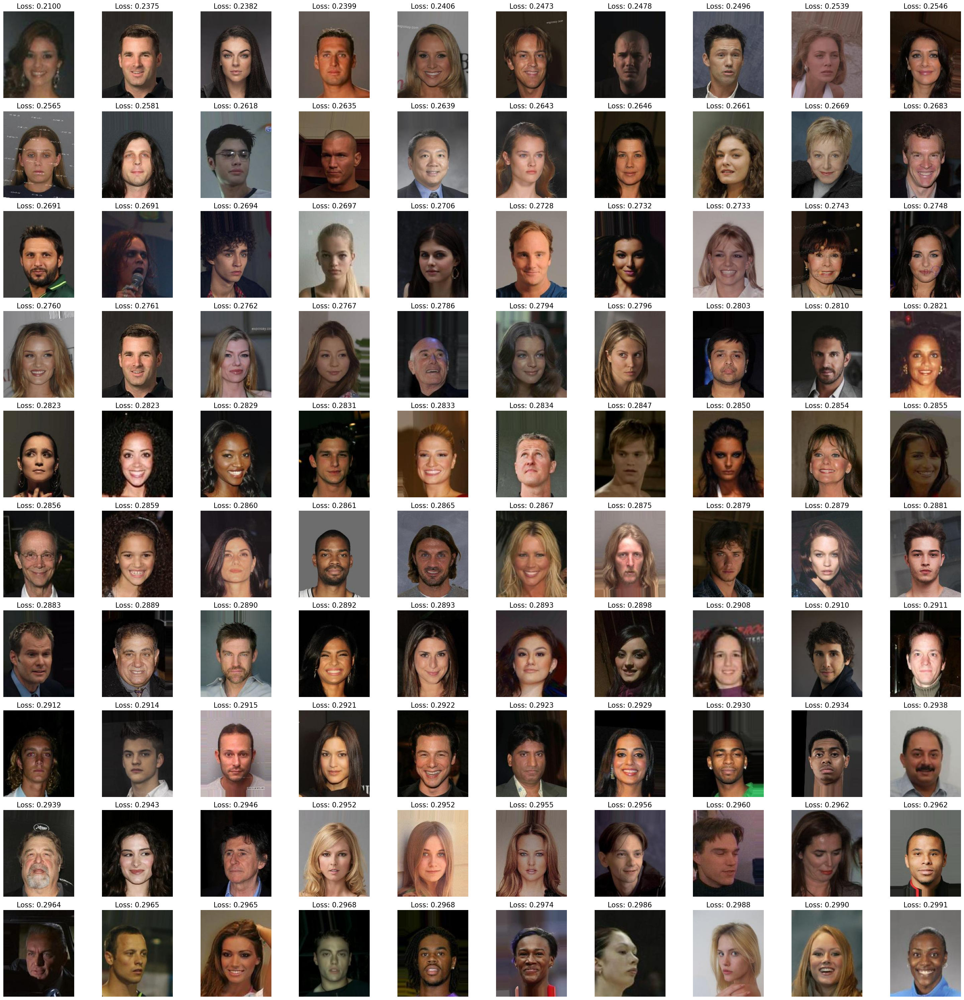

In [29]:
plt.figure(figsize=(30, 30))

for i, idx in enumerate(index):
    plt.subplot(10,10,i+1)
    plt.title(f'Loss: {VAE_loss[idx]:.4f}', fontsize=15)
    img = Image.open(files[idx][0])
    plt.axis('off')
    plt.imshow(img)
    if i > 98:
        break

plt.tight_layout()
plt.savefig('low_loss.png')
plt.show()

#### Images with High reconstruction loss

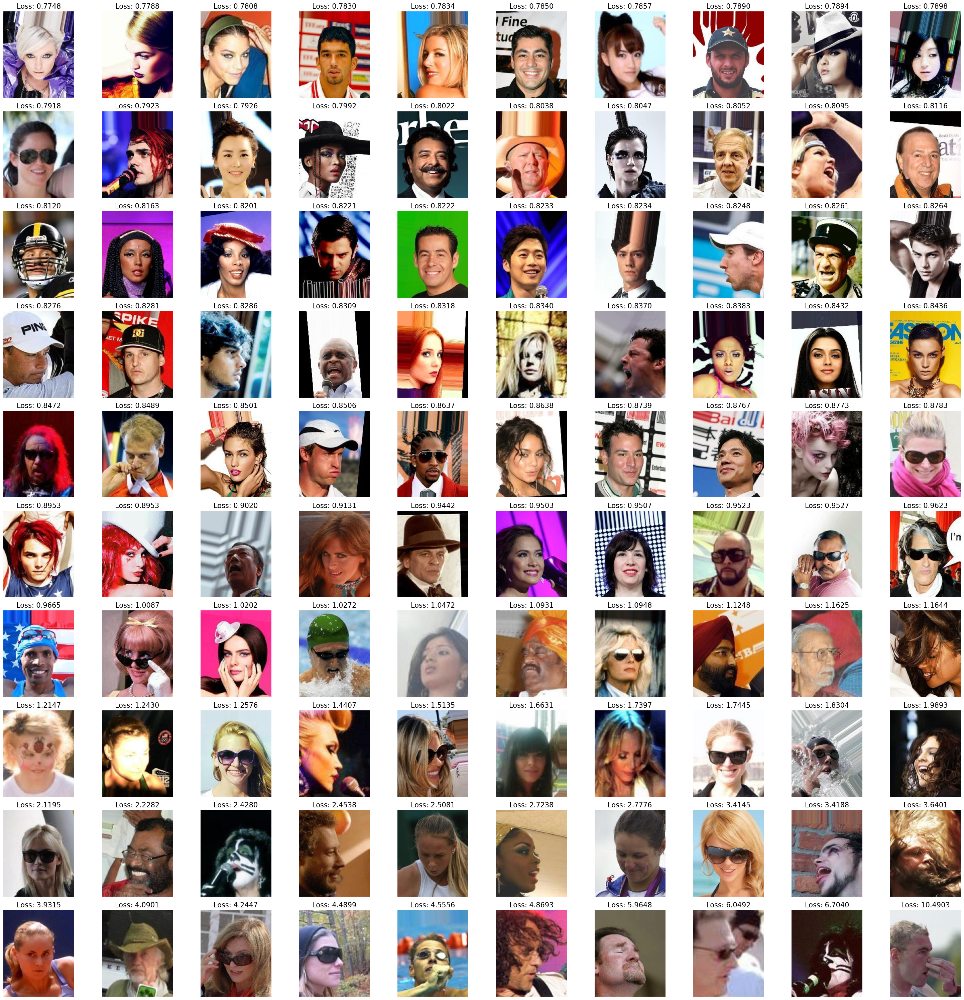

In [30]:
plt.figure(figsize=(30, 30))

for i, idx in enumerate(index[-100::]):
    plt.subplot(10,10,i+1)
    plt.title(f'Loss: {VAE_loss[idx]:.4f}', fontsize=15)
    img = Image.open(files[idx][0])
    plt.axis('off')
    plt.imshow(img)
    if i > 98:
        break

plt.tight_layout()
plt.savefig('high_loss.png')
plt.show()

Observations are noted below

## 2) Introspecting latent space features

### Density of latent features

Choose a latent feature and find out its distribution

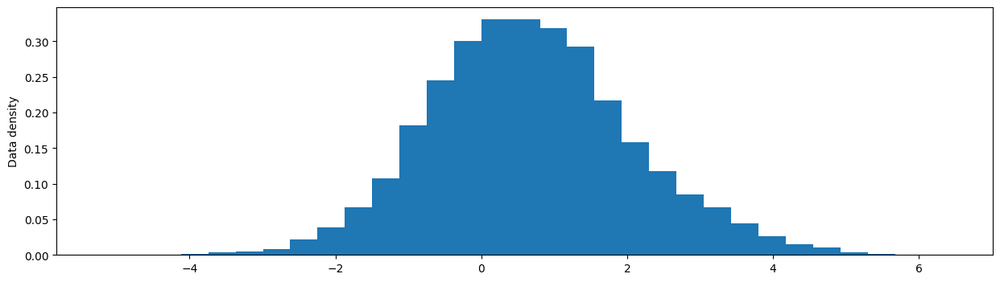

In [31]:
idx_latent = 19 # feature index 19
num_steps = 30

# Extract all latent samples from the desired dimension
latent_samples = z_mean[:, idx_latent]

# Compute their density and plot
density, latent_bins = np.histogram(latent_samples, num_steps, density=True)
plt.subplots(1, 1, figsize=(15, 4))
plt.bar(latent_bins[1:], density)
plt.ylabel("Data density")
plt.savefig('density.png')

Now let us inspect how the reconstruction is affected while changing a single latent feature's value and keeping all other latent features' values as constant. Here the latent feature is selected by `idx_latent` variable and all the corresponding values of that feature is stored in `latent samples` (refer the above code cell).

I have created an interval (of length `num_steps`) for the latent feature `idx_latent` and reconstruct the image by changing only the `idx_latent`th latent feature and keeping all other features constant

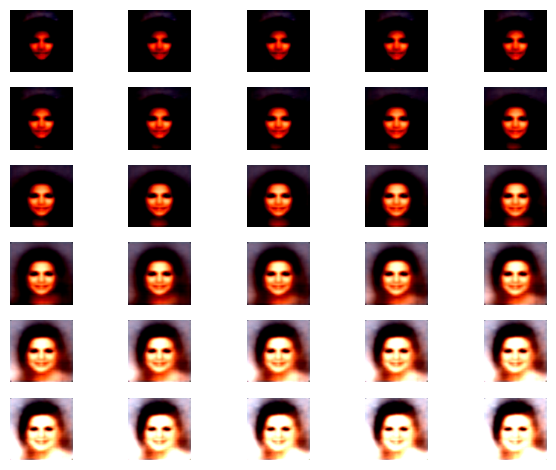

In [34]:
# Visualize reconstructions as we walk across the latent space
latent_steps = np.linspace(np.min(latent_samples), np.max(latent_samples), num_steps)
baseline_latent =  z_mean.mean(0, keepdims=True)  #z_mean[120].reshape(1, -1)

recons = []
for step in latent_steps: 
    # Adjust the latent vector according to our step
    latent = baseline_latent
    latent[0, idx_latent] = step # modifying/stepping only in the particular feature
    recons.append(ss_vae.decode(torch.from_numpy(latent).to(device))[0])


for i, img in enumerate(recons):
    img = img.detach().cpu().permute(1,2,0)
    plt.subplot(6,5,i+1)
    plt.axis('off')
    plt.imshow(img)

plt.tight_layout()
plt.savefig('img5.png')
plt.show()

Reconstructed image above from top left to bottom right corresponds to feature values of the particular latent feature from **lower to higer percentile of the normal distribution**.

### Observations
- Whichever latent feature you choose (`idx_latent` ranges from 0 to 31 as z_dim = 32), they all are normally distributed with mean 0 and std ~1. This is achieved via the normal prior enforced by KL divergence.
- Irrespective of which `base latent` you chose, female faces are dominant. Hence females are over represented in the latent space. 
- Visually, apart from smile attribute there isn't any significant features observed in the reconstructed image (try different values for `latent_idx` and `baseline_latent`, you will get to see it)  
- Almost all recontructions across all latent features, base latent have black background.
- We can say the model is biased in a sense that it gives more priority to black backgrounded, smiling, women images compared to other representation/features.

### Is Accuracy a function of density/distribution of the latent space
Lets check it out using relative accuracy. For each latent feature, logit score is averaged (which says how confident your model says given the input face image is face), relative accuracy is calculated by using such average logit score across all latent features.


And indeed it is a function of the density. The latent space features are normally distributed, here the accuracy plots looks approximately like an inverted Normal distribution.

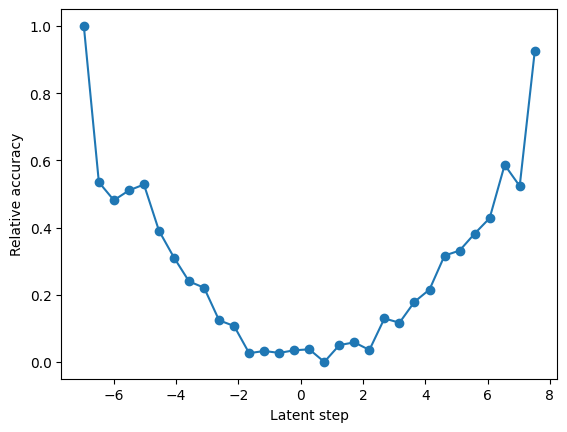

In [33]:
latent_dim = 32
# Loop through every latent dimension
avg_logit_per_bin = []
for idx_latent in range(latent_dim): 
    # Obtained all latent values for corresponding feature
    latent_samples = z_mean[:, idx_latent]
    # Obtaining 5th and 95th percentile values
    start = np.percentile(latent_samples, 5)
    end = np.percentile(latent_samples, 95)
    
    # Creating interval (of length 30) between 5th and 95th interval
    latent_steps = np.linspace(start, end, num_steps)
    
    # Find which samples fall in which bin (among 31 bin)
    which_latent_bin = np.digitize(latent_samples, latent_steps)

    # For each latent bin, compute the accuracy (average logit score)
    # Usually accuracy != logit score. But since all are face images here and the model is very good in classifying
    # we can just sum up the logit score and later calculate relatively best score which gives a proxy of relative accuracy
    avg_logit = []
    for j in range(0, num_steps+1): 
        inds_in_bin = np.where(which_latent_bin == j) # select all index, whose bin = j
        avg_logit.append(y_logit[inds_in_bin].mean()) # calculate the mean logit score for those values that are in bin j
    
    avg_logit_per_bin.append(avg_logit)
    
# Average the results across all latent dimensions and all samples
# i.e Averaging across all latent dimension for corresponding bins (density rangee)
accuracy_per_latent = np.mean(avg_logit_per_bin, 0)

# Calculating relative accuracy across the bins (where each bin is a density range)
accuracy_per_latent = (accuracy_per_latent - accuracy_per_latent.min()) / np.ptp(accuracy_per_latent)

# Plot the results
plt.plot(np.linspace(np.min(z_mean), np.max(z_mean), num_steps+1), accuracy_per_latent,'-o')
plt.xlabel("Latent step")
plt.ylabel("Relative accuracy")
plt.savefig('relative-density.png')